Importing the modules

# Welcome to the notebook 🙂

### Task 1 - Importing the Dataset

In [1]:
import numpy as np
import pandas as pd

# Importing neural network modules
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, BatchNormalization, LeakyReLU, Dropout
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
# Importing some machine learning modules
from sklearn.utils import shuffle
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Import data visualization modules
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

print("Modules are imported!")

2025-06-16 23:50:56.562073: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Modules are imported!


In [2]:
data=pd.read_csv("Creditcard_dataset.csv")

Check the data shape

In [3]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,1,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,7,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,10,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,10,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,11,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Let's see how many genuine and limited fraudulent records we have

In [4]:
data.shape

(50492, 31)

In [5]:
data.Class.value_counts()

0    50000
1      492
Name: Class, dtype: int64

### Task 2 - Data Preprocessing and Exploration

*   Removing all the rows with `Nan` values
*   Removing `Time` column
*   Feature Scaling `Amount` column
*   Split the data into features and labels
*   Data Exploration


Removing the rows `Nan` values in the dataset

In [6]:
data.dropna(inplace=True)
data.shape

(50492, 31)

In [7]:
data=data.drop(axis=1,columns='Time')

Removing Time column

In [8]:
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,7.80,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,9.99,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,27.50,0


Feature Scaling of Amount column

In [9]:
scaler=StandardScaler()
data['Amount']=scaler.fit_transform(data[['Amount']])
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


Let's split the genuine and fraud records into separate dataframes

In [10]:
data_fraud=data[data.Class==1]
data_genuine=data[data.Class==0]
data_fraud
data_genuine

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,-1.266580,-0.400461,0.956221,-0.723919,1.531993,-1.788600,0.314741,0.004704,0.013857,-0.815911,...,-0.157831,-0.883365,0.088485,-0.076790,-0.095833,0.132720,-0.028468,0.126494,-0.368731,0
49996,0.219529,0.881246,-0.635891,0.960928,-0.152971,-1.014307,0.427126,0.121340,-0.285670,-0.111640,...,0.099936,0.337120,0.251791,0.057688,-1.508368,0.144023,0.181205,0.215243,-0.270727,0
49997,-1.775135,-0.004235,1.189786,0.331096,1.196063,5.519980,-1.518185,2.080825,1.159498,-0.594242,...,0.103302,0.654850,-0.348929,0.745323,0.704545,-0.127579,0.454379,0.130308,-0.034011,0
49998,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,-0.369238,0


Split the data into features and labels

In [11]:
data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.150105,0
1,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,...,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,-0.199848,0
2,1.449044,-1.176339,0.913860,-1.375667,-1.971383,-0.629152,-1.423236,0.048456,-1.720408,1.626659,...,-0.009302,0.313894,0.027740,0.500512,0.251367,-0.129478,0.042850,0.016253,-0.339490,0
3,0.384978,0.616109,-0.874300,-0.094019,2.924584,3.317027,0.470455,0.538247,-0.558895,0.309755,...,0.049924,0.238422,0.009130,0.996710,-0.767315,-0.492208,0.042472,-0.054337,-0.330223,0
4,1.069374,0.287722,0.828613,2.712520,-0.178398,0.337544,-0.096717,0.115982,-0.221083,0.460230,...,-0.036876,0.074412,-0.071407,0.104744,0.548265,0.104094,0.021491,0.021293,-0.256128,0


In [12]:
X=data.drop('Class',axis=1)
y=data.Class


Data Exploration
  - Apply PCA to reduce the dimensionality of features `X` into two dimensions
  - Use a scatter plot to visualize our data

In [13]:
pca=PCA(2)
transformed_data=pca.fit_transform(X)
df=pd.DataFrame(transformed_data)
df['label']=y
df

,0,1,label
0,-0.447845,1.197251,0
1,-0.582393,0.258126,0
2,-0.939401,-0.728781,0
3,-0.630759,-0.498846,0
4,-0.536286,-1.055333,0
...,...,...,...
50487,10.855744,-2.787701,1
50488,6.927739,-4.950318,1
50489,7.038190,-2.785257,1
50490,11.649171,-1.992088,1


Let's Use a scatter plot to visualize our data

In [14]:
px.scatter(df,x=0,y=1,color=df.label.astype(str))

### Task 3 - Building the Generator Model

### Write a method to create the Generator model architecture

In [31]:
def build_generator():
    model=Sequential()
    
    model.add(Dense(32,activation="relu",input_dim=29,kernel_initializer="he_uniform"))
    model.add(BatchNormalization())
    
    
    model.add(Dense(64,activation="relu"))
    model.add(BatchNormalization())
    
    
    model.add(Dense(128,activation="relu"))
    model.add(BatchNormalization())
    
    
    model.add(Dense(29,activation="linear"))
    model.summary()
    return model 
build_generator()
    

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_70 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_21 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_71 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_22 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_72 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_23 (Bat  (None, 128)            

### Task 4 - Building the Discriminator Model

Write a method to create the Discriminator model architecture

In [32]:
def build_discriminator():
    model=Sequential()
    
    model.add(Dense(128,input_dim=29,activation='relu',kernel_initializer='he_uniform'))
    
    model.add(Dense(64,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(16,activation='relu'))
    
    model.add(Dense(1,activation='sigmoid'))
    model.compile(optimizer='adam',loss='binary_crossentropy')
    model.summary()
    return model
build_discriminator()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_74 (Dense)            (None, 128)               3840      
                                                                 
 dense_75 (Dense)            (None, 64)                8256      
                                                                 
 dense_76 (Dense)            (None, 32)                2080      
                                                                 
 dense_77 (Dense)            (None, 32)                1056      
                                                                 
 dense_78 (Dense)            (None, 16)                528       
                                                                 
 dense_79 (Dense)            (None, 1)                 17        
                                                                 
Total params: 15,777
Trainable params: 15,777
Non-tra

### Task 5 - Combine Generator and Discriminator models to Build The GAN

In [33]:
def build_gan(generator,discriminator):
    discriminator.trainable=False
    gan_input=Input(shape=(generator.input_shape[1],))
    x= generator(gan_input)
    
    gan_output=discriminator(x)
    gan=Model(gan_input,gan_output)
    gan.summary()
    return gan


Let's create a method that generates synthetic data using the Generator

In [34]:
def generate_synthetic_data(generator,num_samples):
    noise=np.random.normal(0,1,(num_samples,generator.input_shape[1]))
    fake_data=generator.predict(noise)
    return fake_data

### Task 6 - Train and evaluate our GAN
*    Defining some variables
*    Creating our GAN
*    Training the GAN
*    Monitor the GAN performance using PCA




In [35]:
def monitor_generator(generator):
    # Initialize a PCA (Principal Component Analysis) object with 2 components
    pca = PCA(n_components=2)

    # Drop the 'Class' column from the fraud dataset to get real data
    real_fraud_data = data_fraud.drop("Class", axis=1)

    # Transform the real fraud data using PCA
    transformed_data_real = pca.fit_transform(real_fraud_data.values)

    # Create a DataFrame for the transformed real data and add a 'label' column with the value 'real'
    df_real = pd.DataFrame(transformed_data_real)
    df_real['label'] = "real"

    # Generate synthetic fraud data using the provided generator and specify the number of samples (492 in this case)
    synthetic_fraud_data = generate_synthetic_data(generator, 492)

    # Transform the synthetic fraud data using PCA
    transformed_data_fake = pca.fit_transform(synthetic_fraud_data)

    # Create a DataFrame for the transformed fake data and add a 'label' column with the value 'fake'
    df_fake = pd.DataFrame(transformed_data_fake)
    df_fake['label'] = "fake"

    # Concatenate the real and fake data DataFrames
    df_combined = pd.concat([df_real, df_fake])

    # Create a scatterplot to visualize the data points, using the first and second PCA components as x and y, respectively,
    # and color points based on the 'label' column, with a size of 10
    plt.figure()
    sns.scatterplot(data=df_combined, x=0, y=1, hue='label', s=10)
    plt.show()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_80 (Dense)            (None, 32)                960       
                                                                 
 batch_normalization_24 (Bat  (None, 32)               128       
 chNormalization)                                                
                                                                 
 dense_81 (Dense)            (None, 64)                2112      
                                                                 
 batch_normalization_25 (Bat  (None, 64)               256       
 chNormalization)                                                
                                                                 
 dense_82 (Dense)            (None, 128)               8320      
                                                                 
 batch_normalization_26 (Bat  (None, 128)            

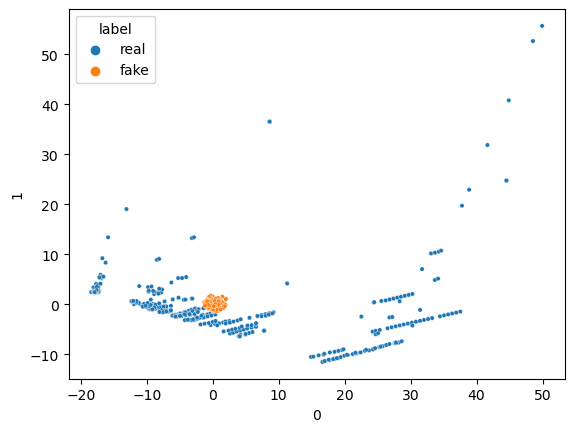

16/16 [==============================] - 0s 921us/step


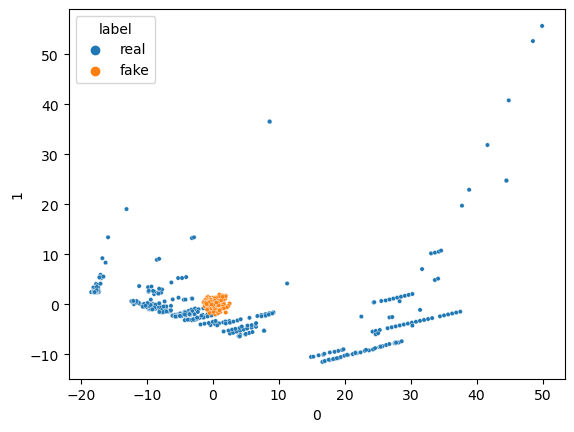

16/16 [==============================] - 0s 865us/step


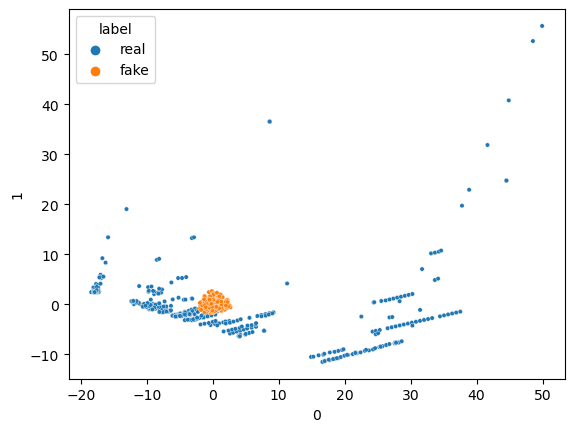

16/16 [==============================] - 0s 6ms/step


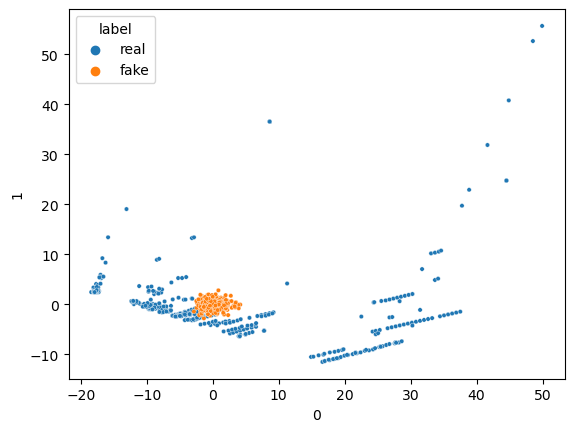

16/16 [==============================] - 0s 918us/step


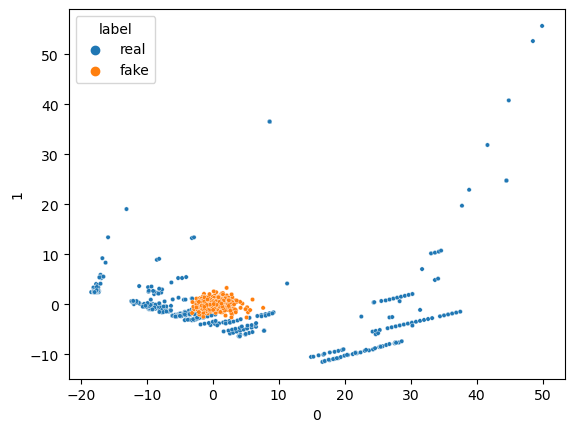

16/16 [==============================] - 0s 902us/step


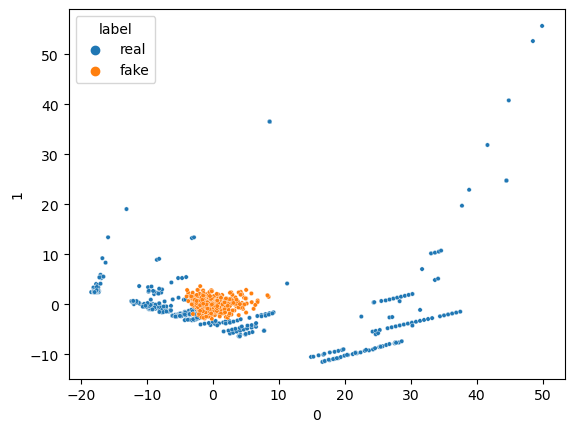

16/16 [==============================] - 0s 6ms/step


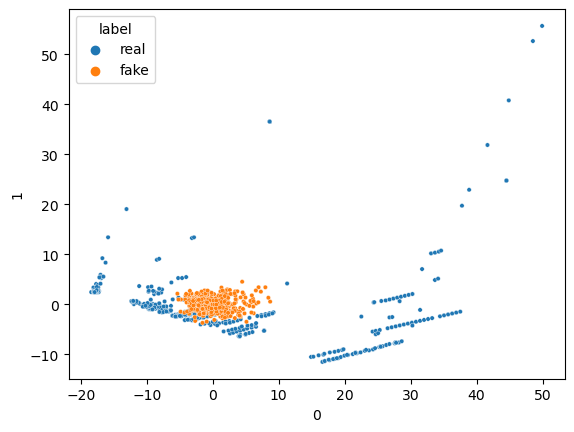

16/16 [==============================] - 0s 831us/step


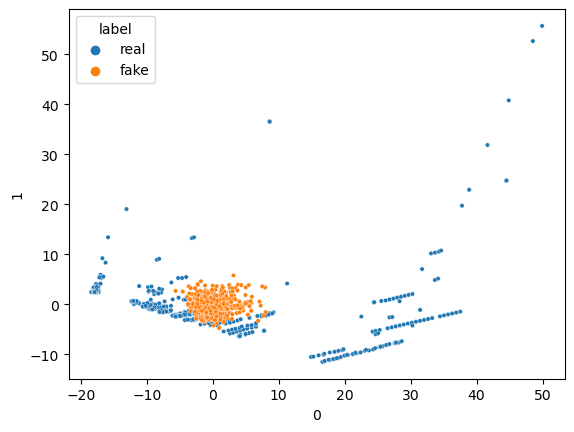

16/16 [==============================] - 0s 6ms/step


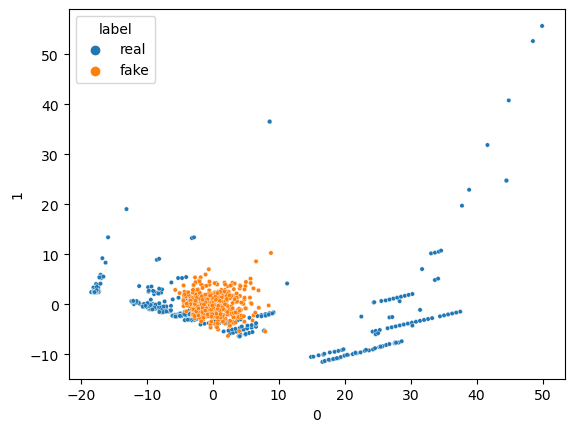

16/16 [==============================] - 0s 1ms/step


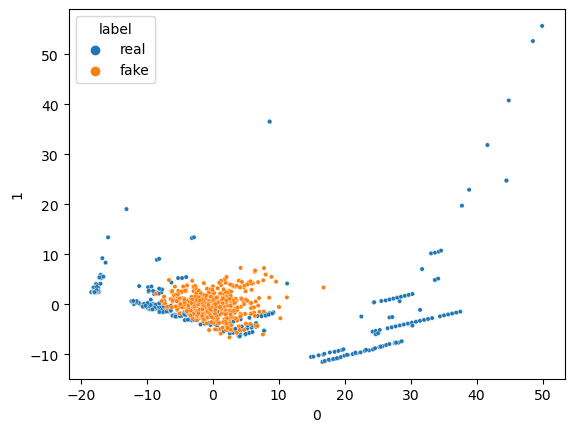

16/16 [==============================] - 0s 753us/step


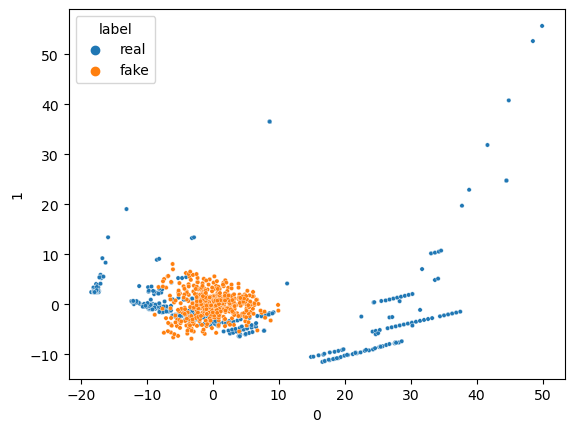

16/16 [==============================] - 0s 807us/step


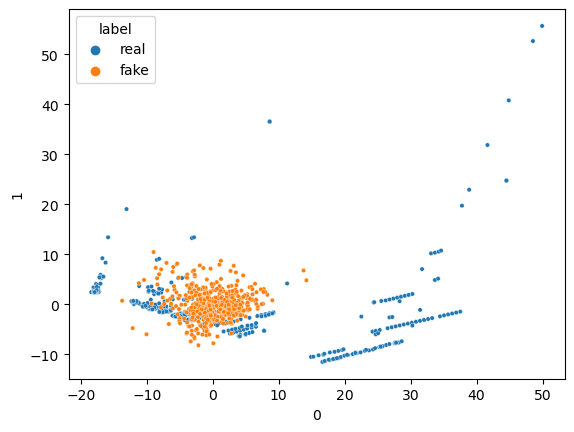

16/16 [==============================] - 0s 853us/step


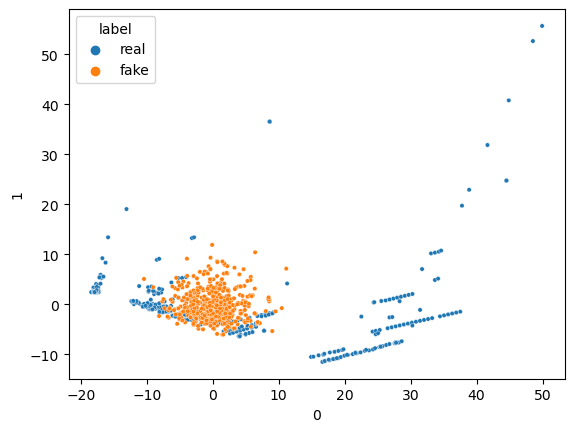

16/16 [==============================] - 0s 1ms/step


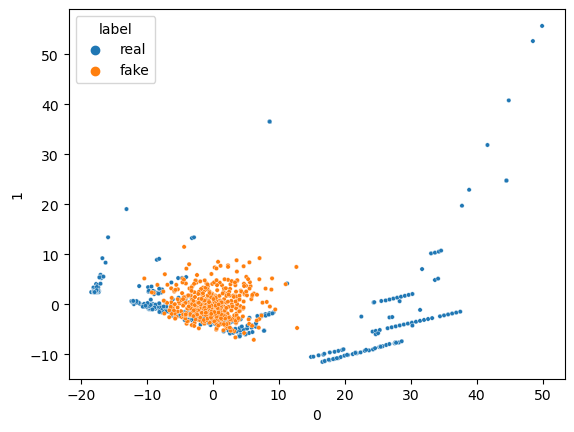

16/16 [==============================] - 0s 869us/step


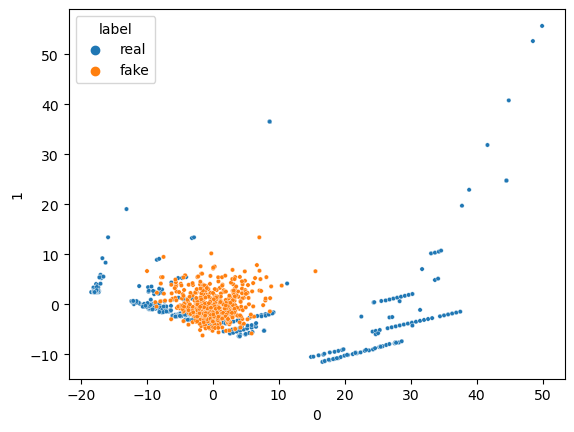

16/16 [==============================] - 0s 801us/step


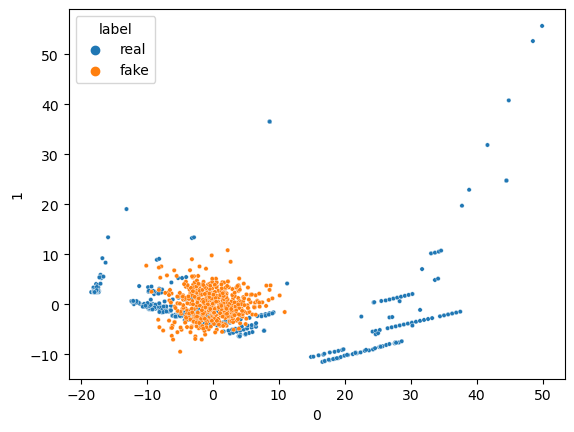

16/16 [==============================] - 0s 6ms/step


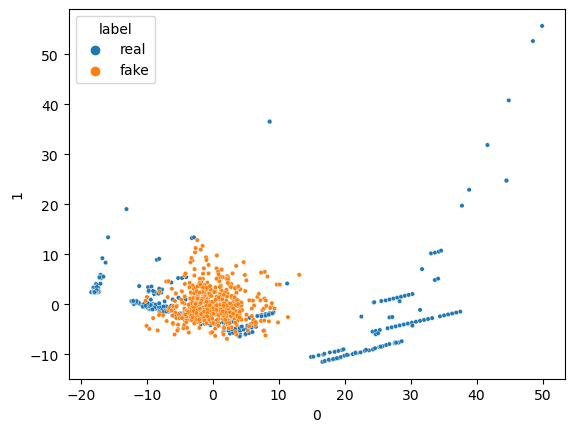

16/16 [==============================] - 0s 771us/step


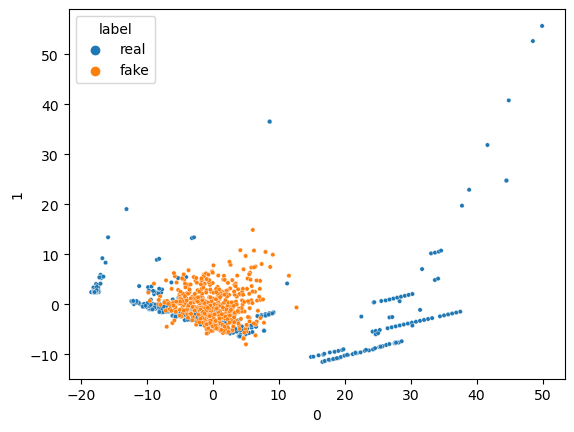

16/16 [==============================] - 0s 6ms/step


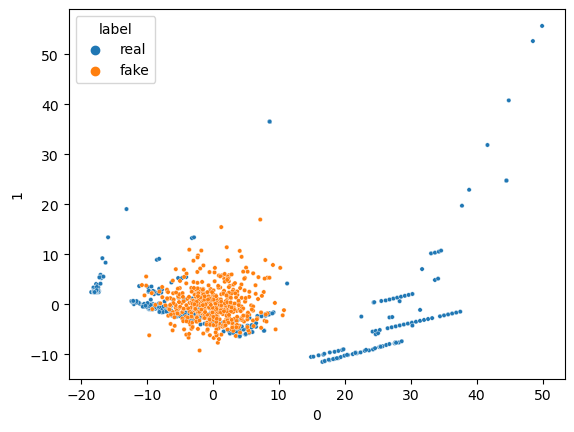

16/16 [==============================] - 0s 790us/step


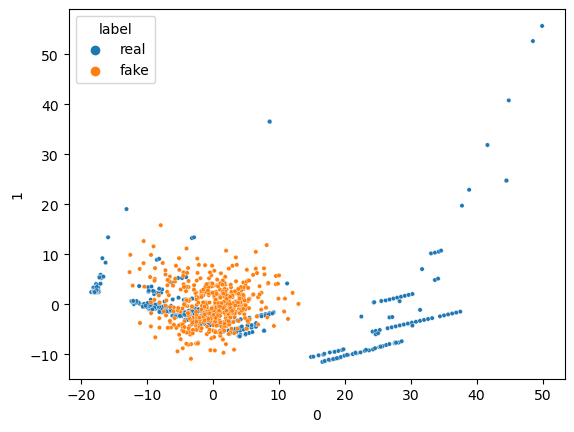

16/16 [==============================] - 0s 851us/step


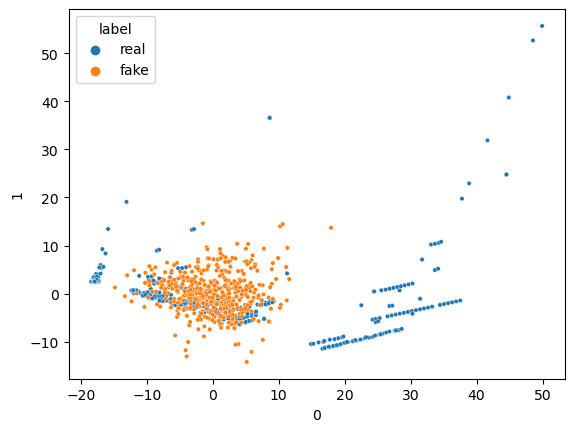

16/16 [==============================] - 0s 6ms/step


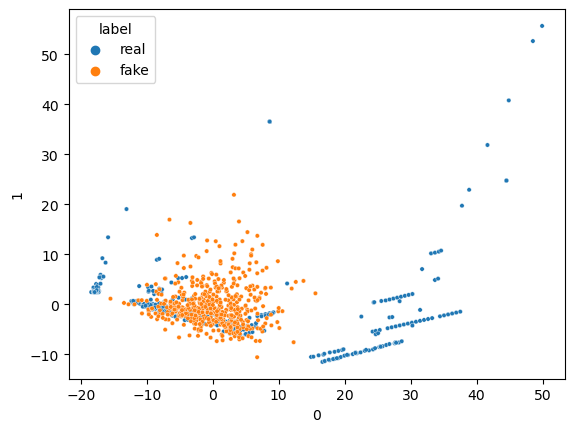

16/16 [==============================] - 0s 785us/step


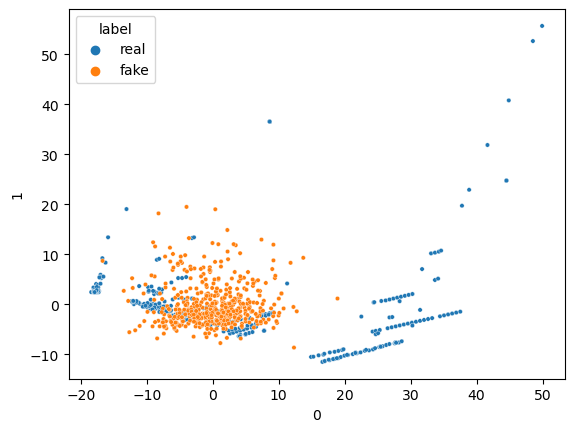

16/16 [==============================] - 0s 831us/step


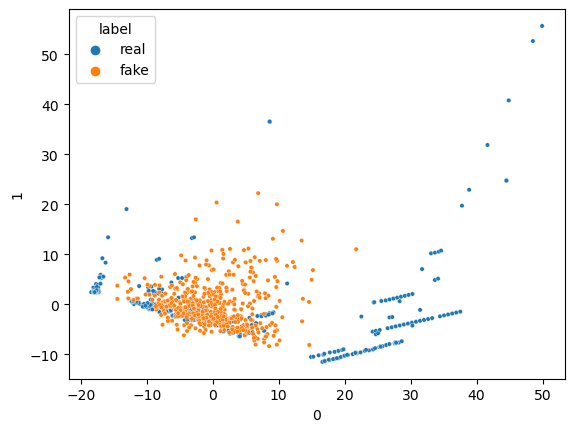

16/16 [==============================] - 0s 851us/step


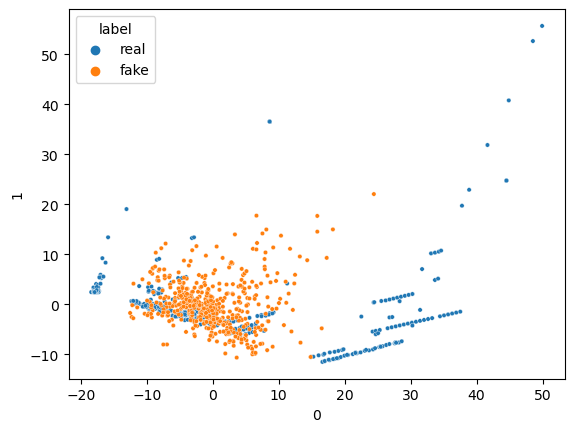

16/16 [==============================] - 0s 814us/step


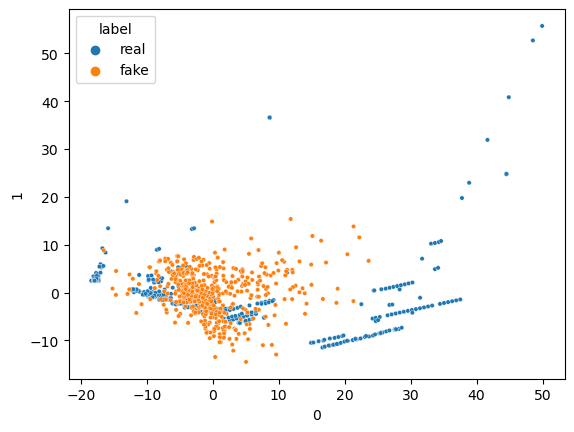

16/16 [==============================] - 0s 6ms/step


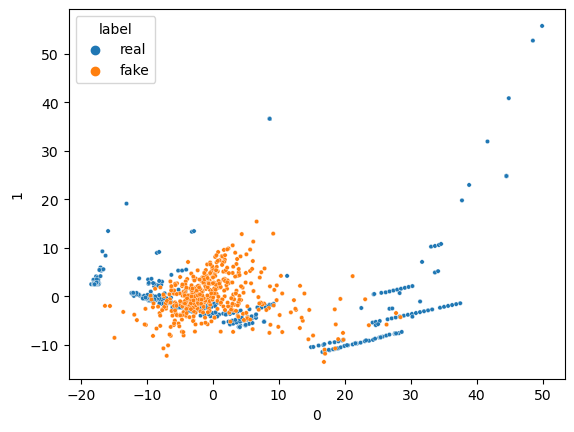

16/16 [==============================] - 0s 6ms/step


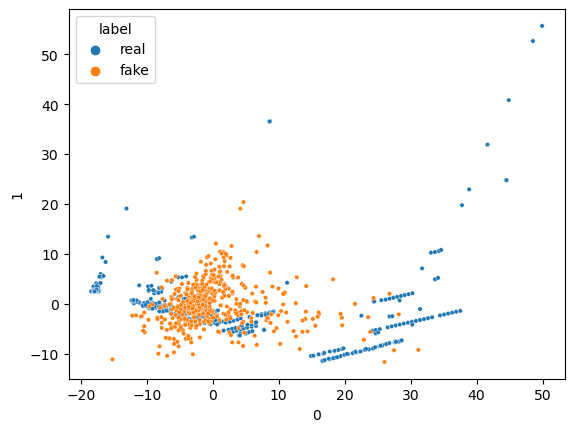

16/16 [==============================] - 0s 955us/step


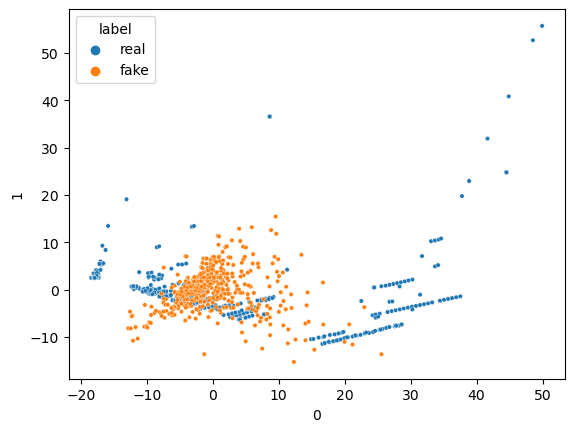

16/16 [==============================] - 0s 744us/step


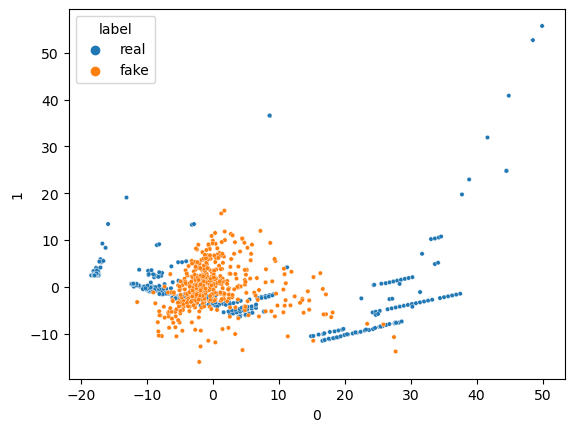

16/16 [==============================] - 0s 888us/step


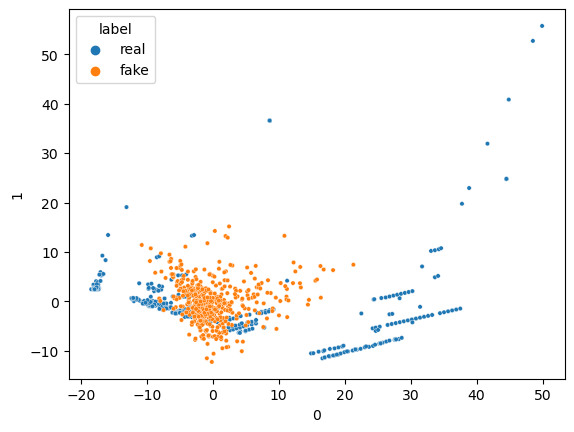

16/16 [==============================] - 0s 6ms/step


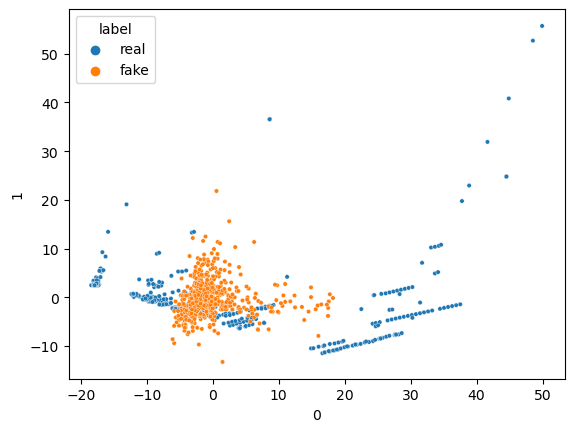

16/16 [==============================] - 0s 788us/step


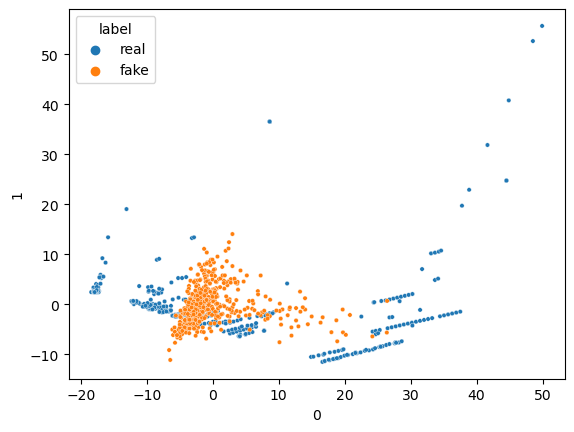

16/16 [==============================] - 0s 6ms/step


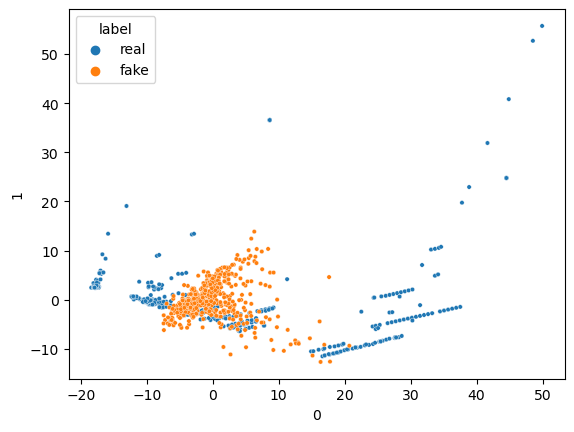

16/16 [==============================] - 0s 6ms/step


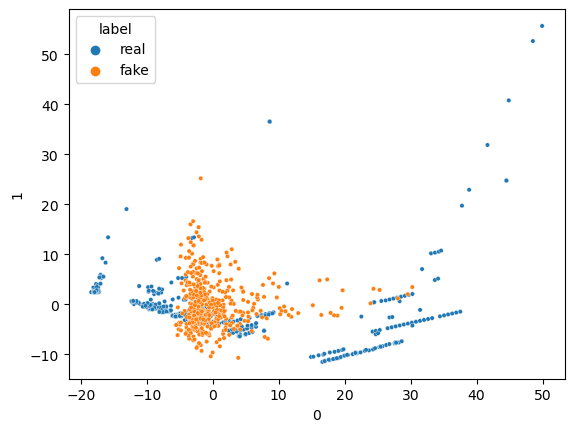

16/16 [==============================] - 0s 1ms/step


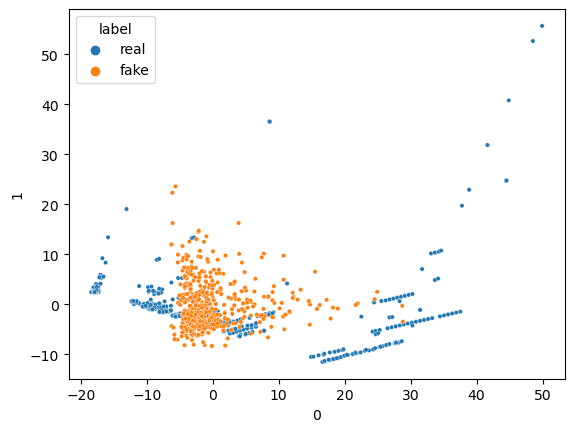

16/16 [==============================] - 0s 796us/step


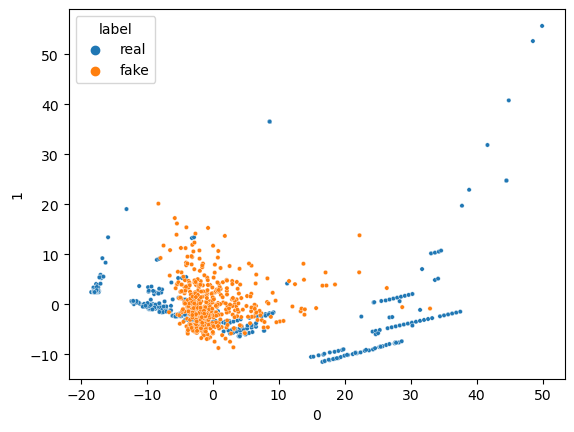

16/16 [==============================] - 0s 756us/step


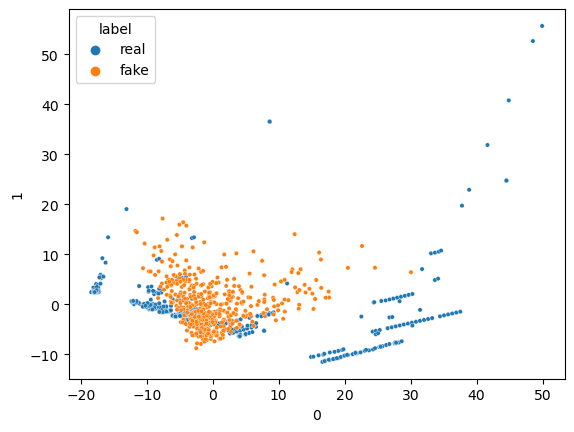

16/16 [==============================] - 0s 6ms/step


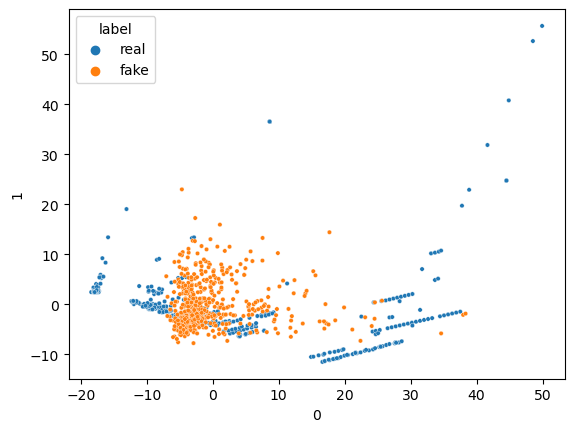

16/16 [==============================] - 0s 902us/step


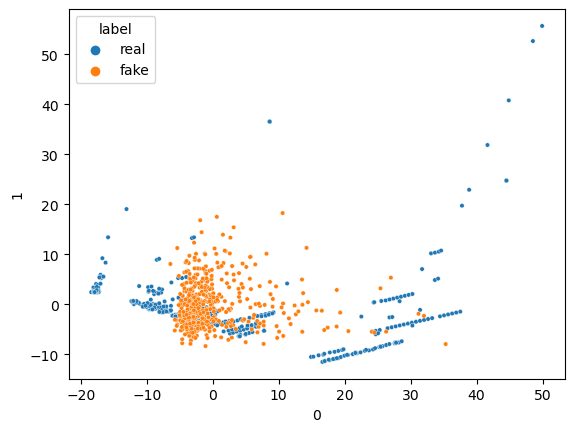

16/16 [==============================] - 0s 6ms/step


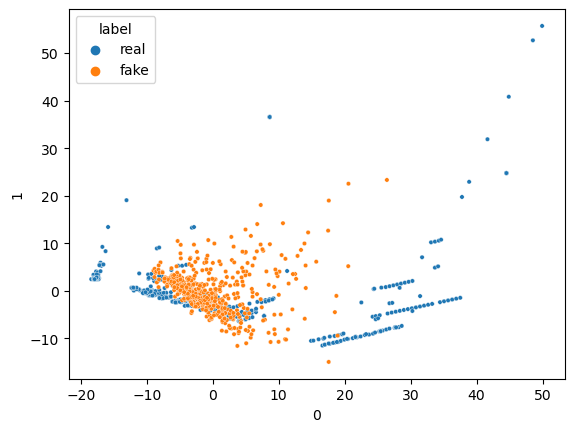

16/16 [==============================] - 0s 6ms/step


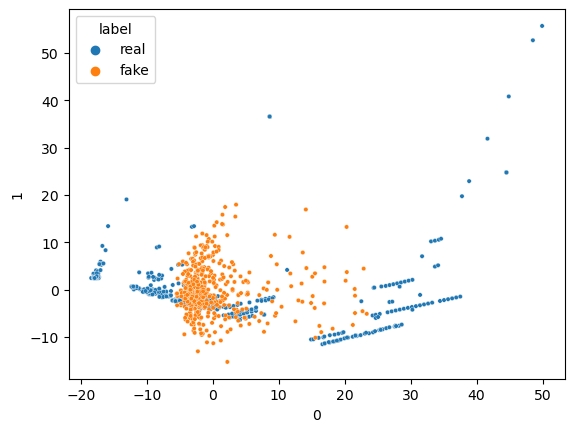

16/16 [==============================] - 0s 788us/step


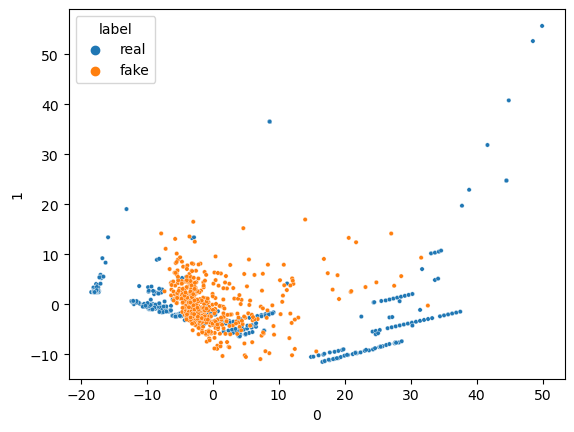

16/16 [==============================] - 0s 921us/step


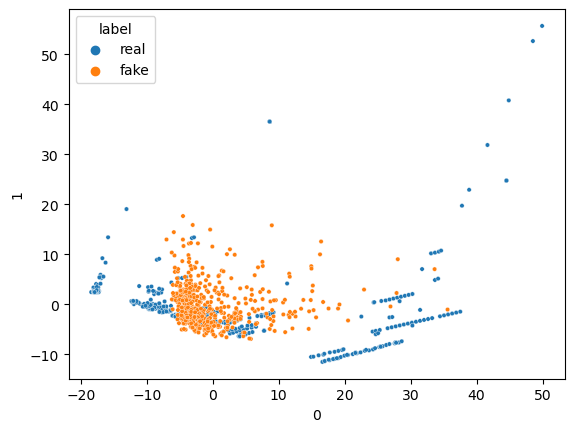

16/16 [==============================] - 0s 829us/step


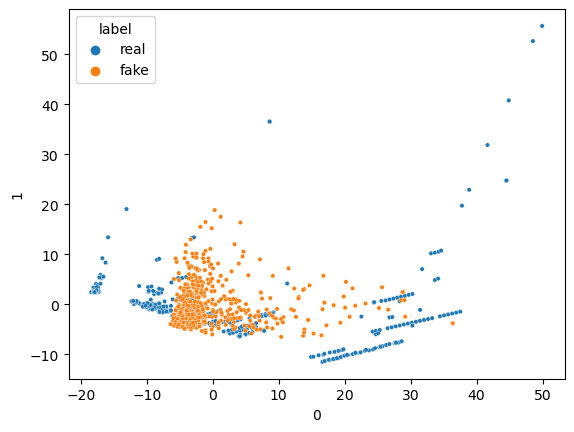

16/16 [==============================] - 0s 1ms/step


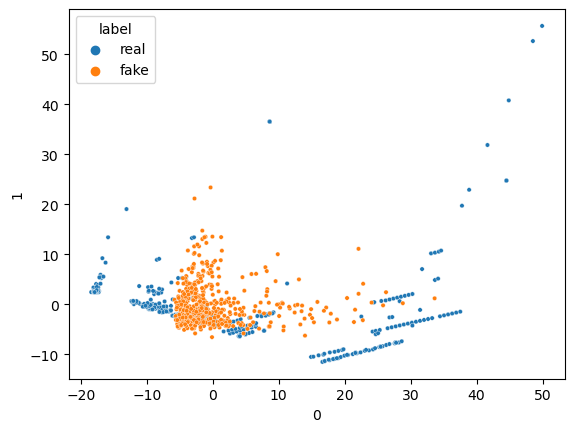

16/16 [==============================] - 0s 6ms/step


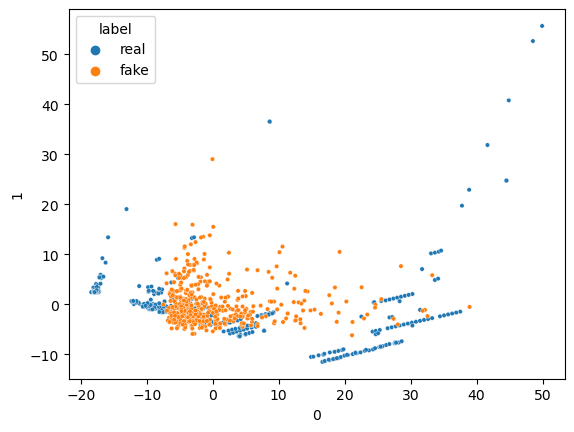

16/16 [==============================] - 0s 6ms/step


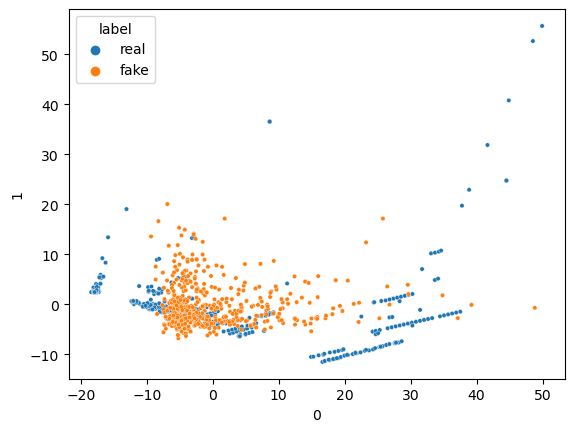

16/16 [==============================] - 0s 872us/step


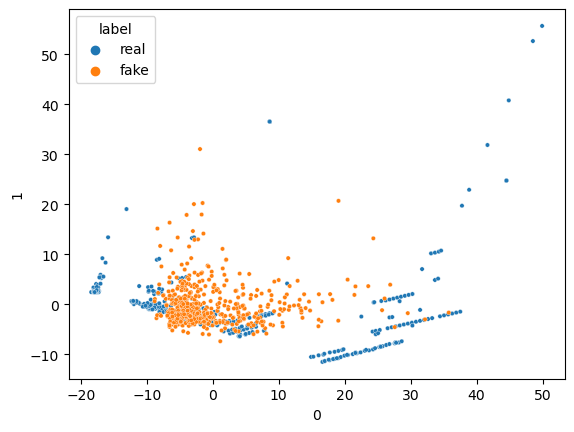

16/16 [==============================] - 0s 831us/step


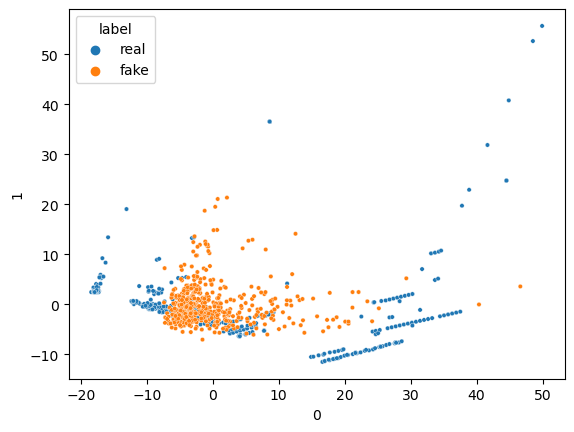

16/16 [==============================] - 0s 1ms/step


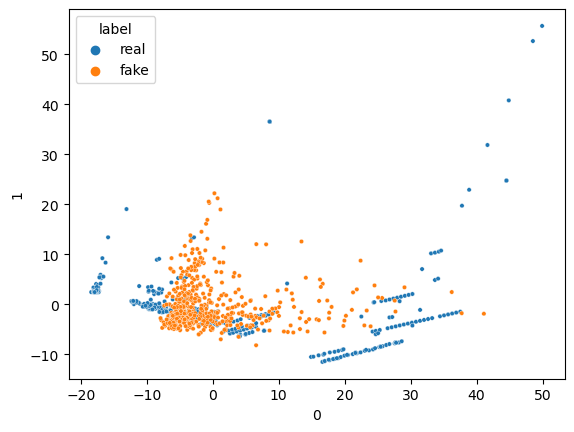

16/16 [==============================] - 0s 6ms/step


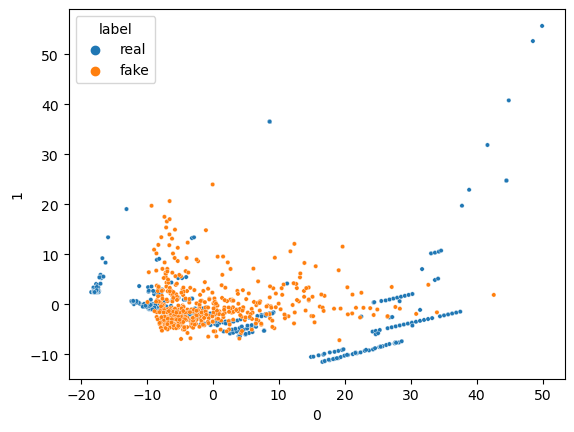

16/16 [==============================] - 0s 776us/step


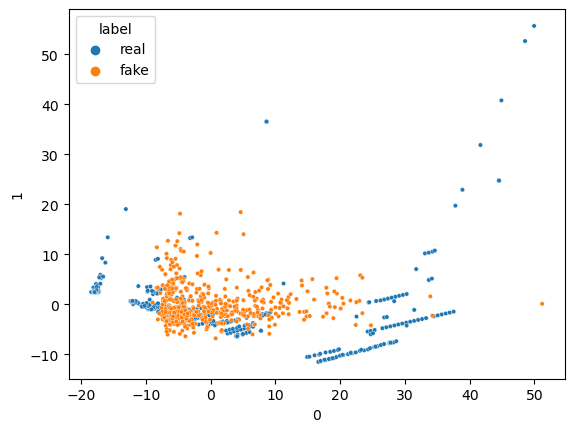

16/16 [==============================] - 0s 792us/step


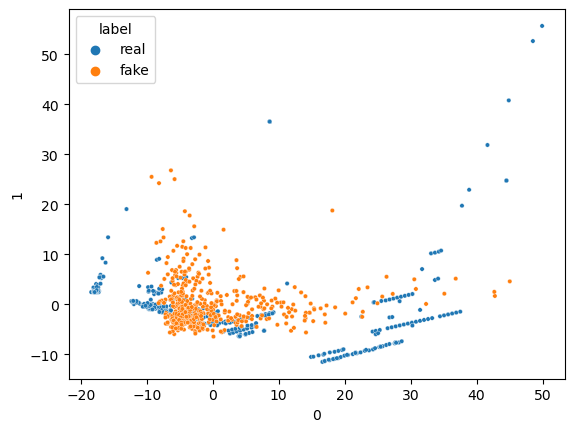

16/16 [==============================] - 0s 799us/step


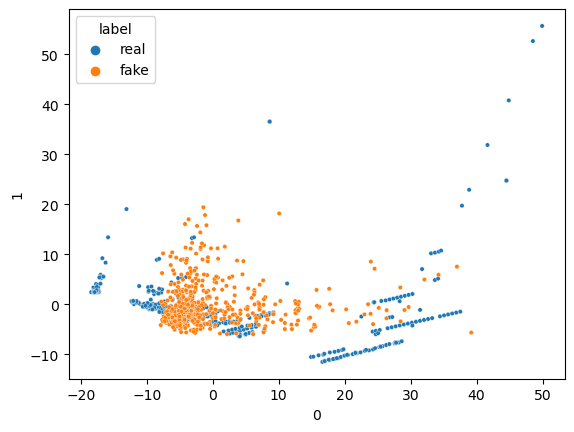

16/16 [==============================] - 0s 776us/step


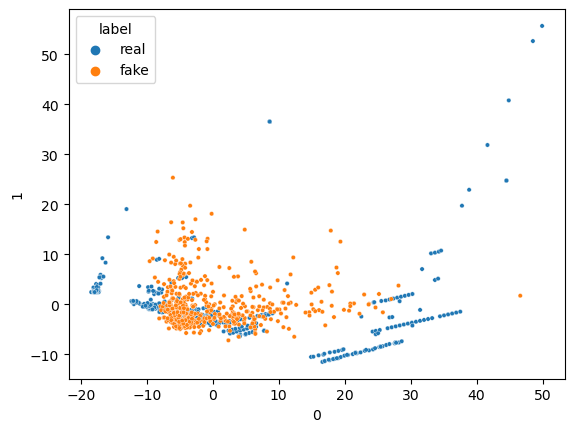

16/16 [==============================] - 0s 748us/step


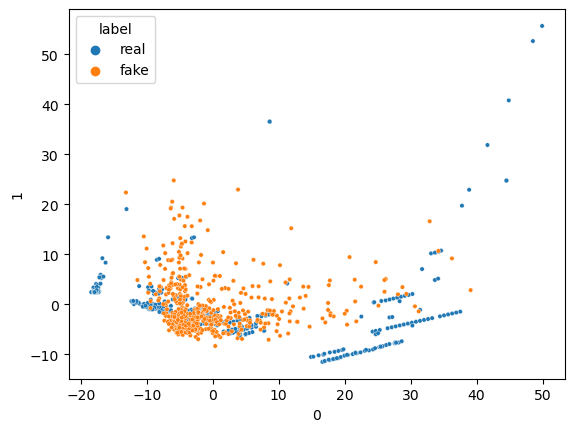

16/16 [==============================] - 0s 1ms/step


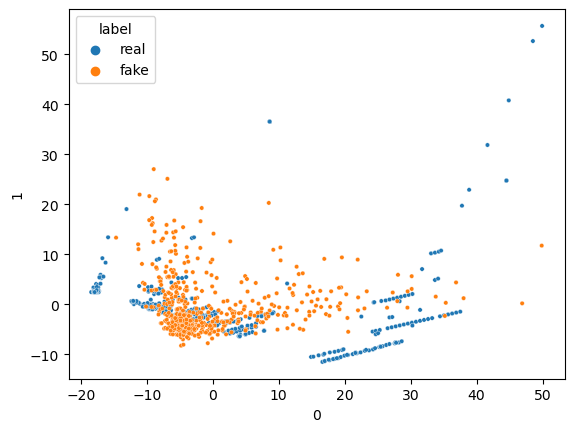

16/16 [==============================] - 0s 6ms/step


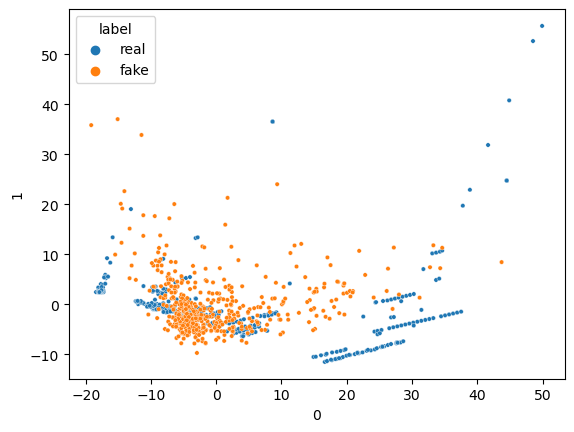

16/16 [==============================] - 0s 6ms/step


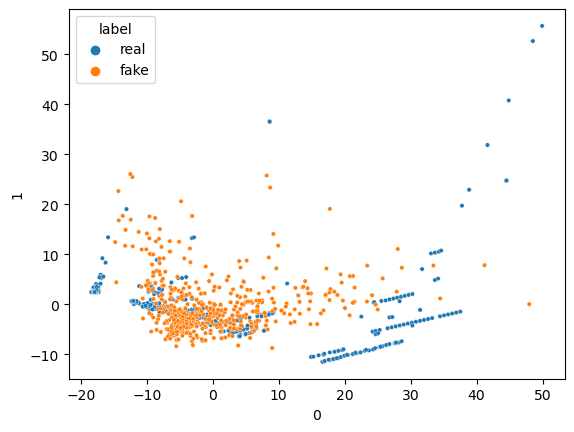

16/16 [==============================] - 0s 786us/step


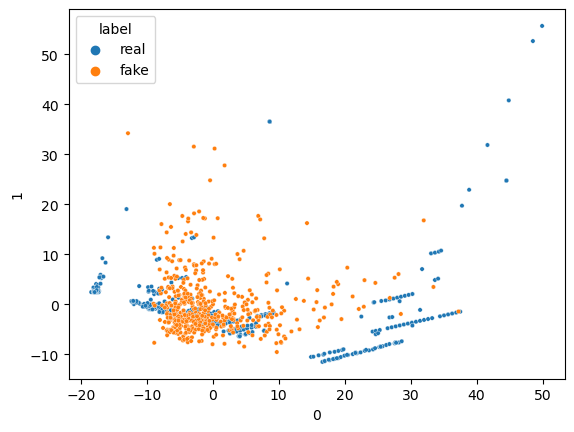

16/16 [==============================] - 0s 806us/step


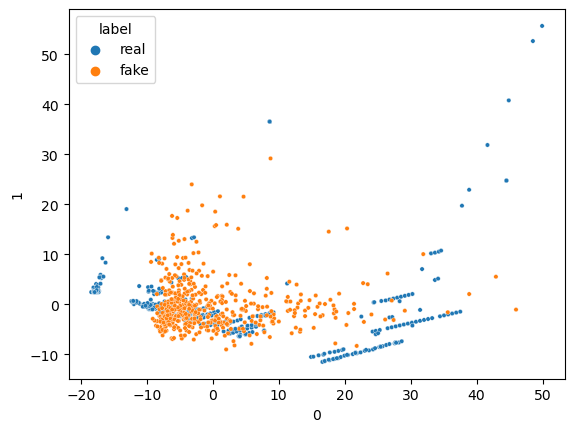

16/16 [==============================] - 0s 819us/step


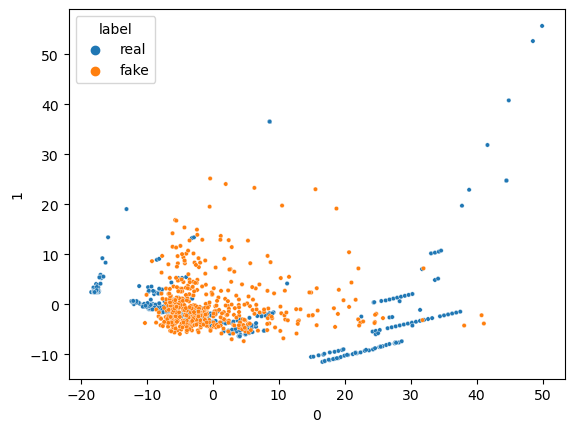

16/16 [==============================] - 0s 788us/step


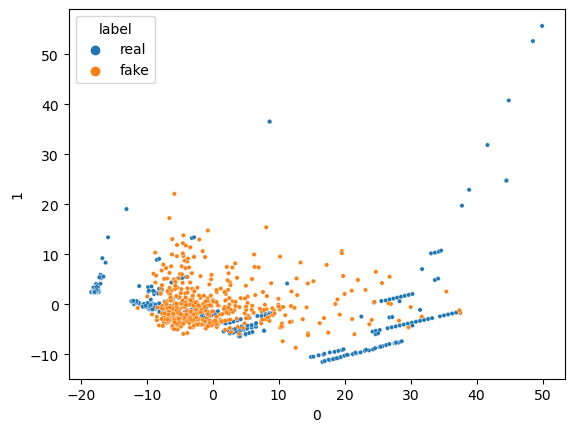

16/16 [==============================] - 0s 715us/step


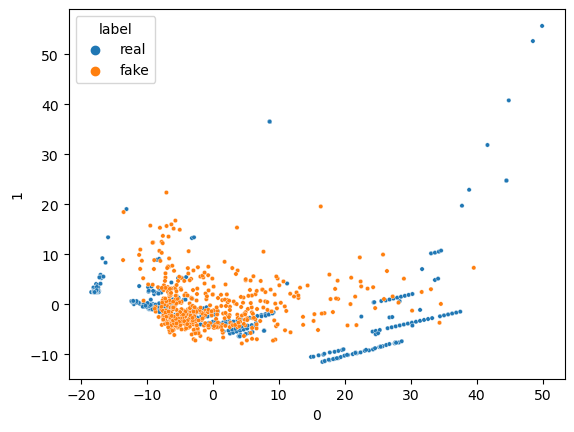

16/16 [==============================] - 0s 1ms/step


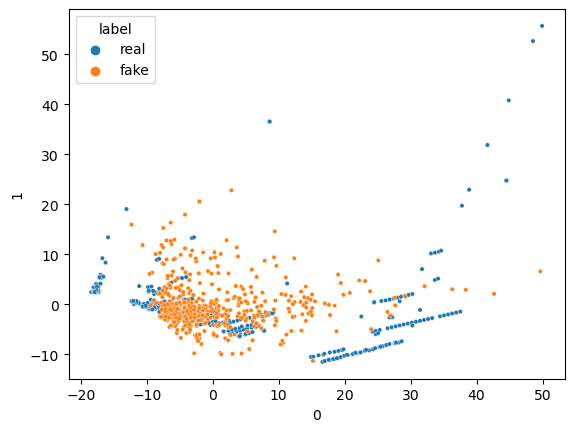

16/16 [==============================] - 0s 6ms/step


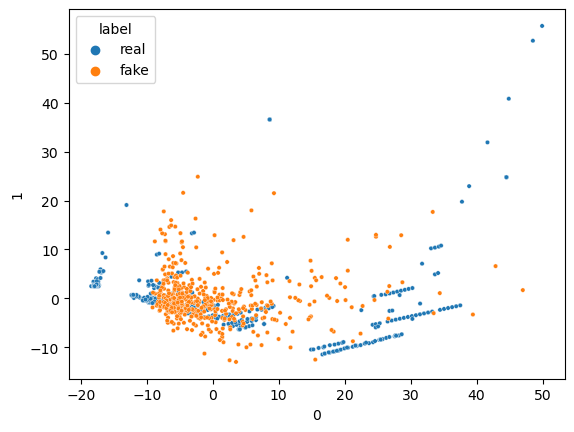

16/16 [==============================] - 0s 6ms/step


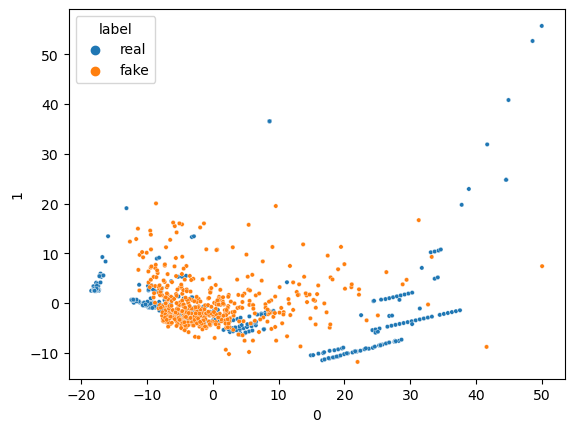

16/16 [==============================] - 0s 6ms/step


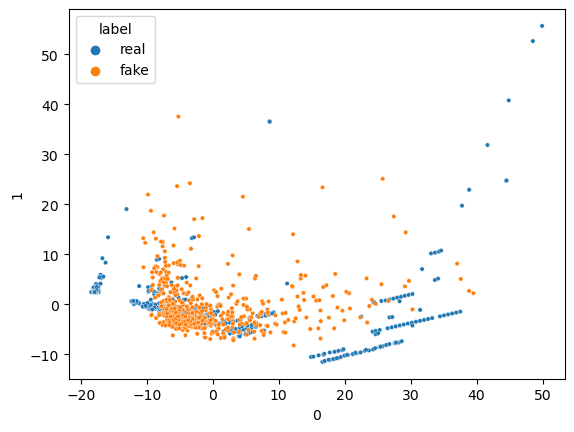

16/16 [==============================] - 0s 6ms/step


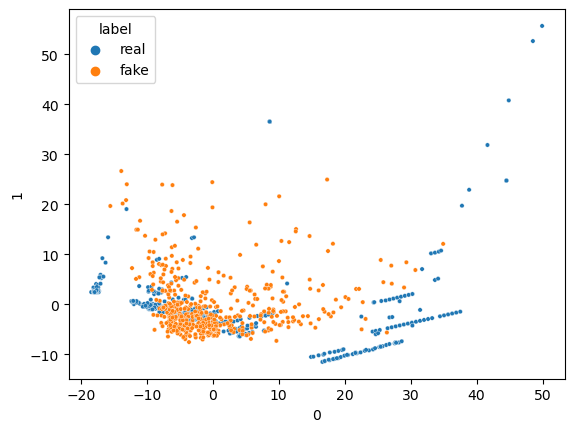

16/16 [==============================] - 0s 777us/step


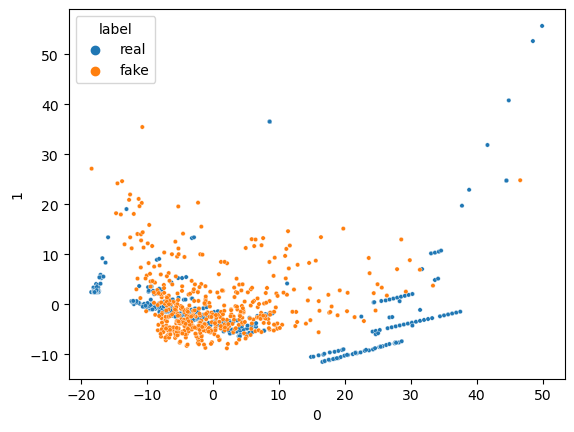

16/16 [==============================] - 0s 6ms/step


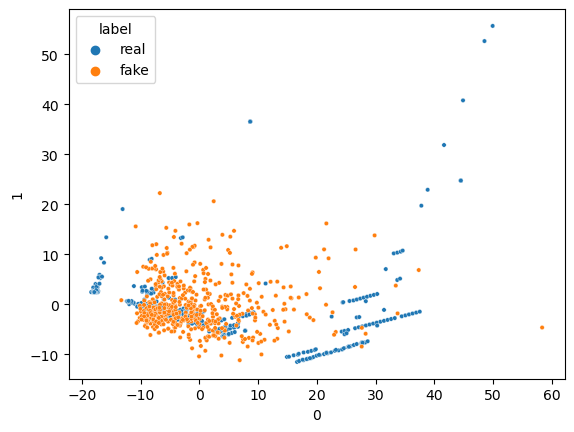

16/16 [==============================] - 0s 785us/step


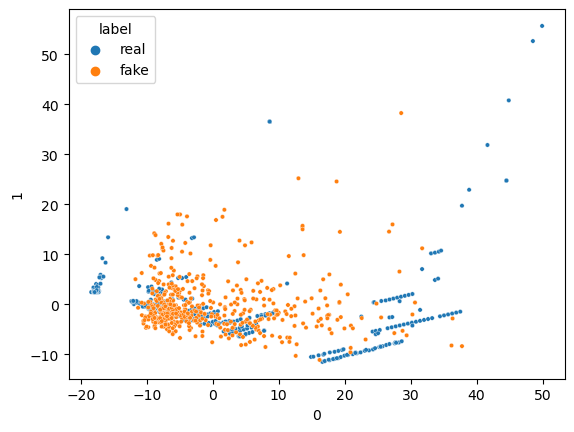

16/16 [==============================] - 0s 811us/step


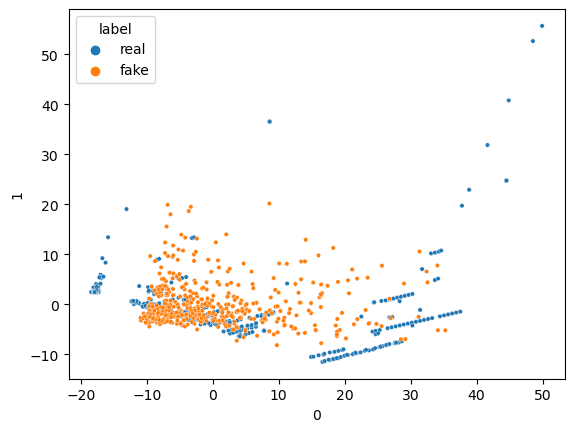

16/16 [==============================] - 0s 764us/step


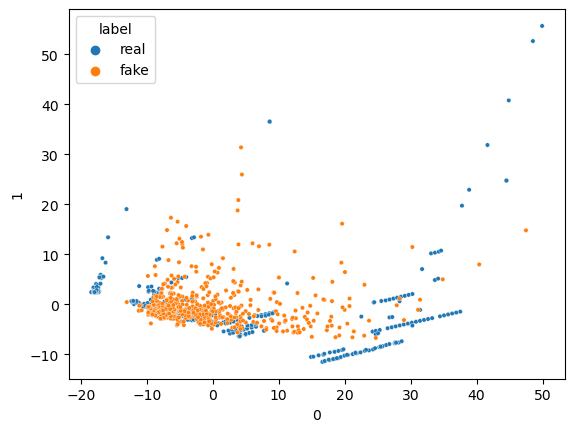

16/16 [==============================] - 0s 749us/step


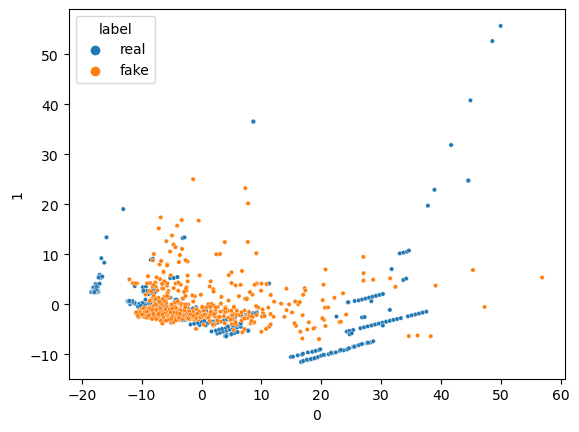

16/16 [==============================] - 0s 800us/step


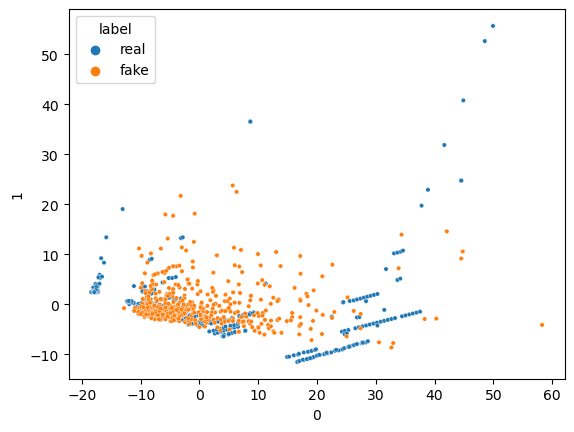

16/16 [==============================] - 0s 1ms/step


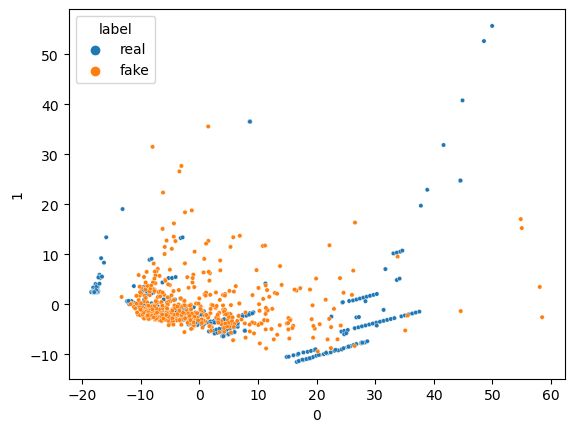

16/16 [==============================] - 0s 820us/step


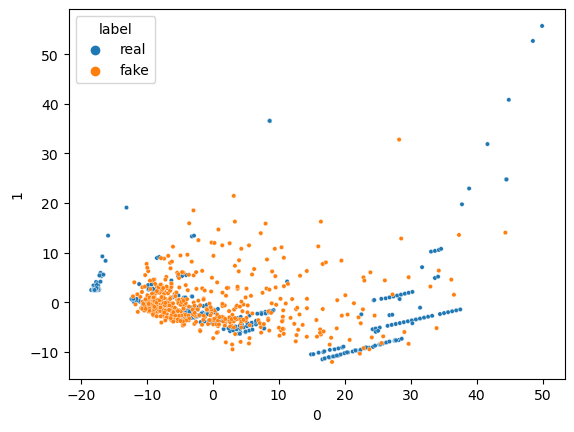

16/16 [==============================] - 0s 5ms/step


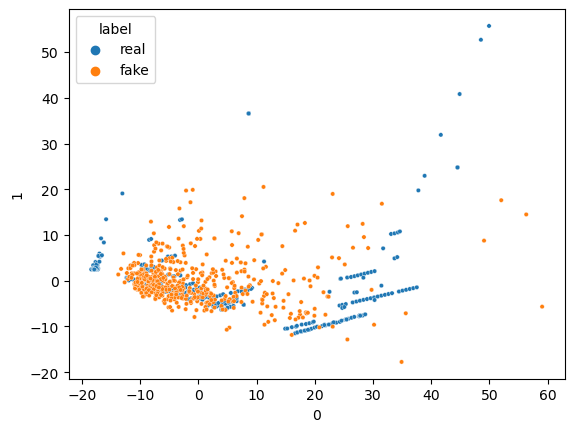

16/16 [==============================] - 0s 769us/step


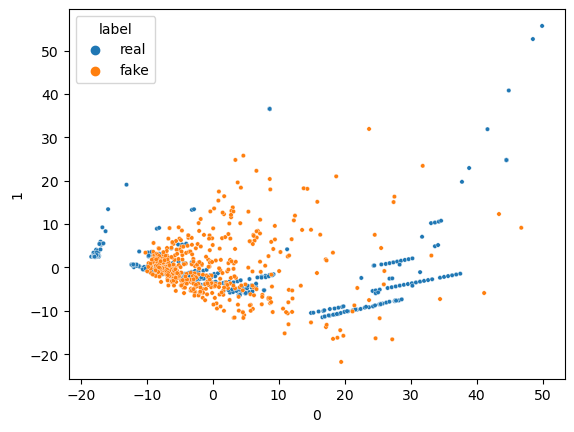

16/16 [==============================] - 0s 813us/step


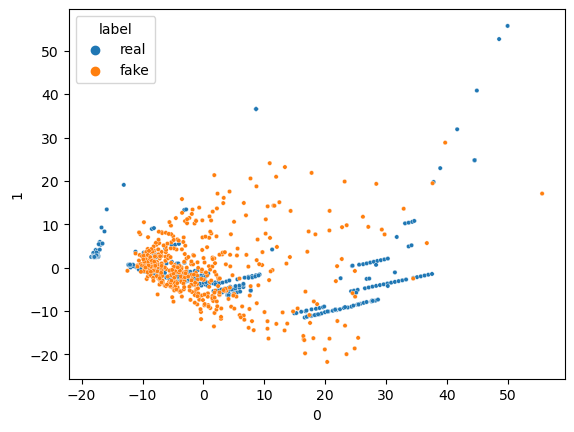

16/16 [==============================] - 0s 6ms/step


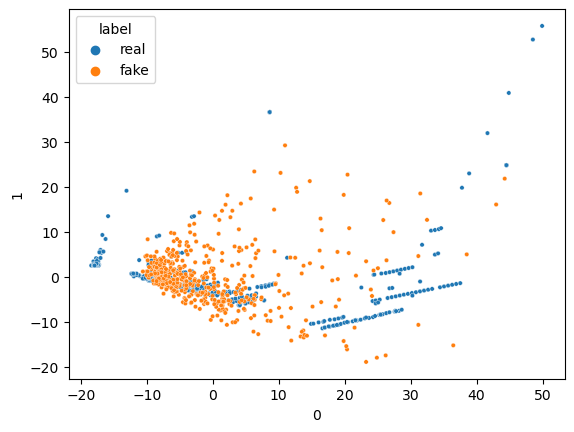

16/16 [==============================] - 0s 6ms/step


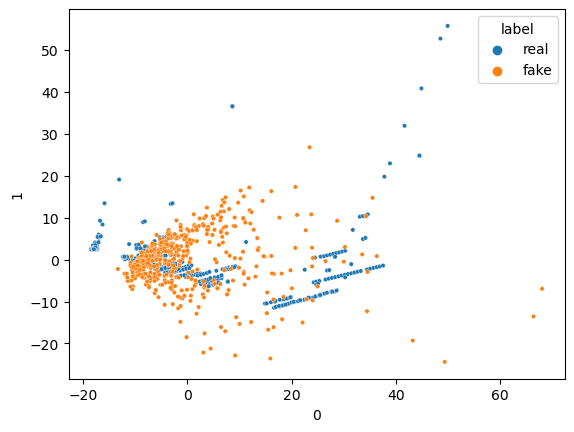

16/16 [==============================] - 0s 822us/step


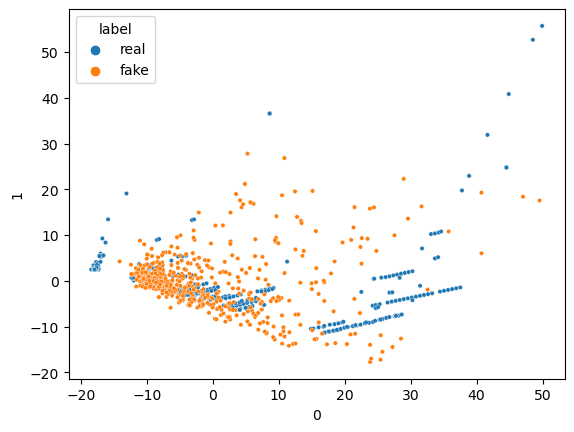

16/16 [==============================] - 0s 931us/step


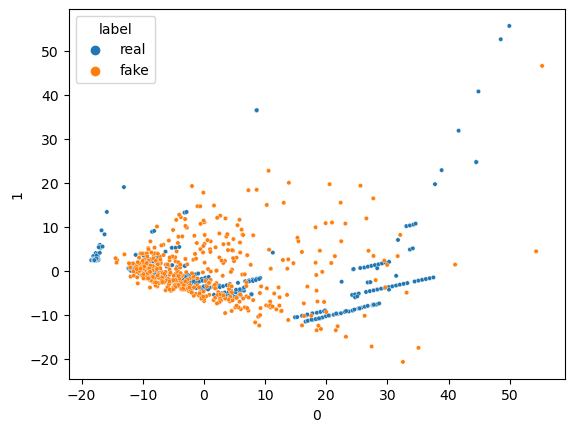

16/16 [==============================] - 0s 786us/step


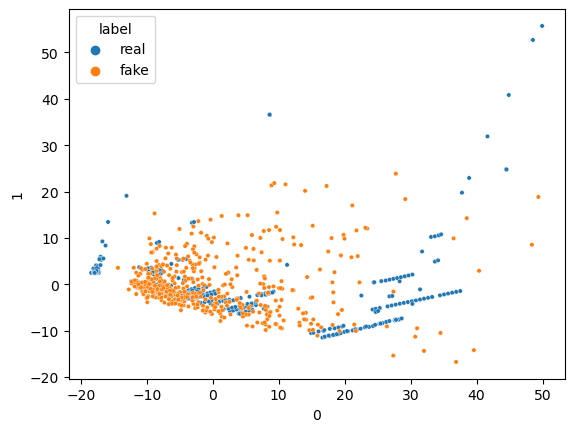

16/16 [==============================] - 0s 858us/step


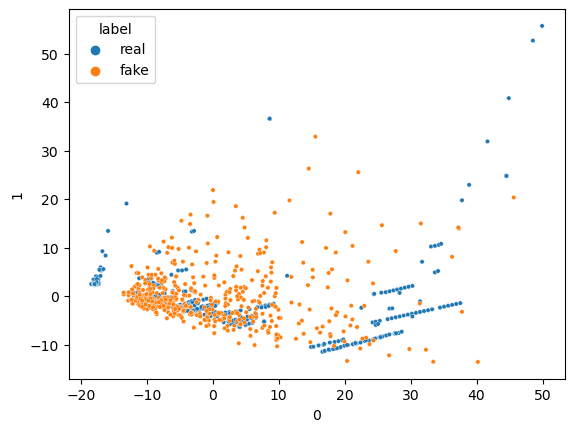

16/16 [==============================] - 0s 813us/step


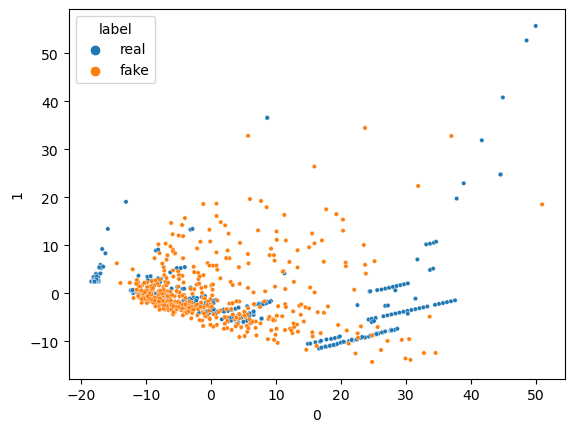

16/16 [==============================] - 0s 856us/step


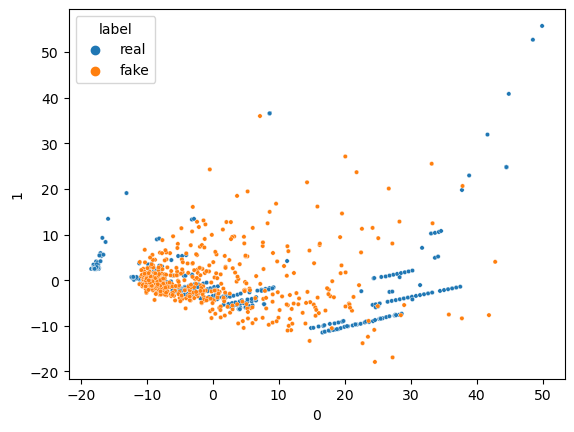

16/16 [==============================] - 0s 861us/step


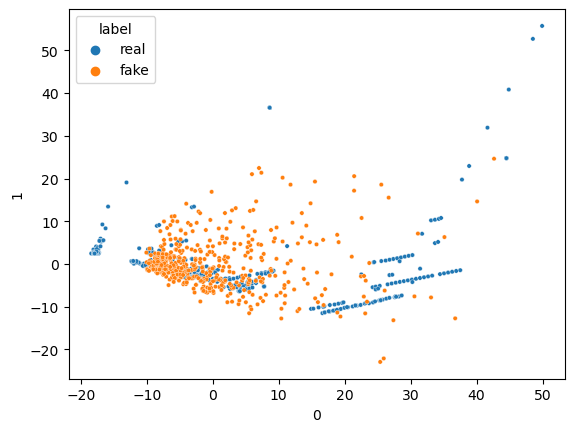

16/16 [==============================] - 0s 825us/step


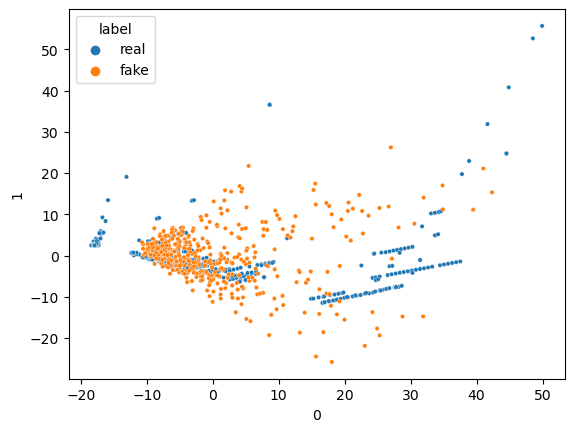

16/16 [==============================] - 0s 6ms/step


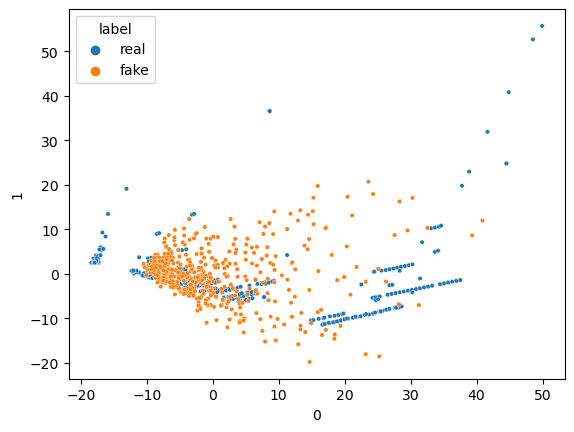

16/16 [==============================] - 0s 6ms/step


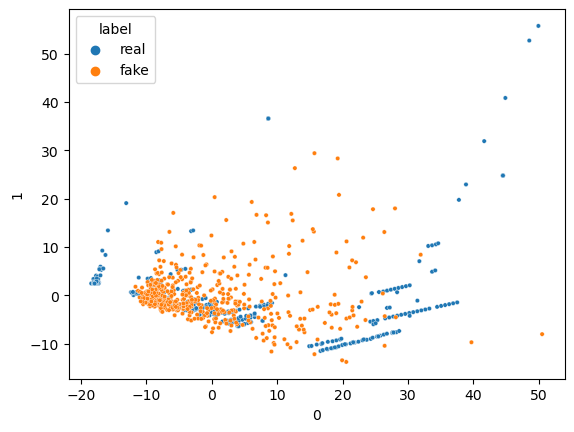

16/16 [==============================] - 0s 875us/step


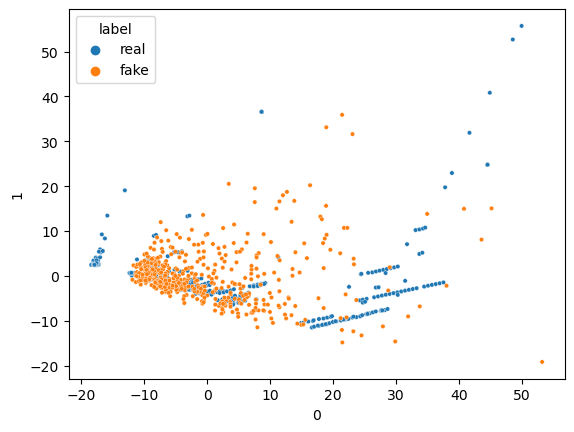

16/16 [==============================] - 0s 901us/step


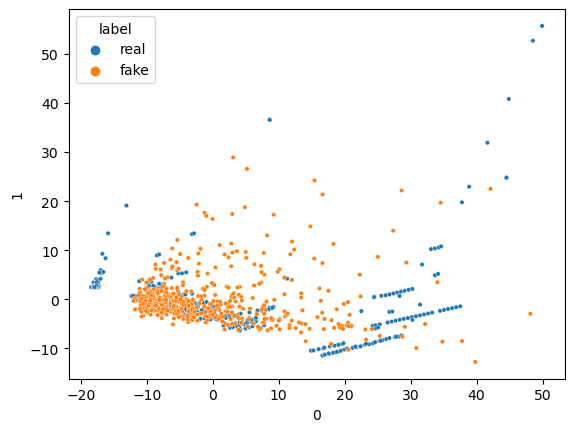

16/16 [==============================] - 0s 6ms/step


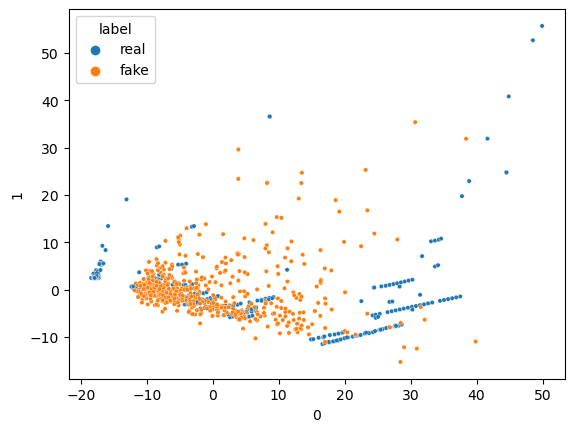

16/16 [==============================] - 0s 6ms/step


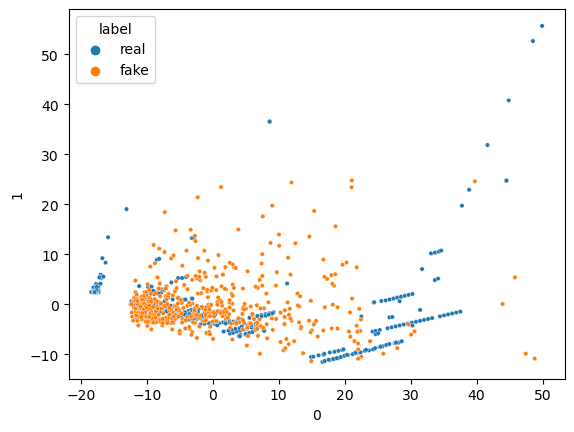

16/16 [==============================] - 0s 6ms/step


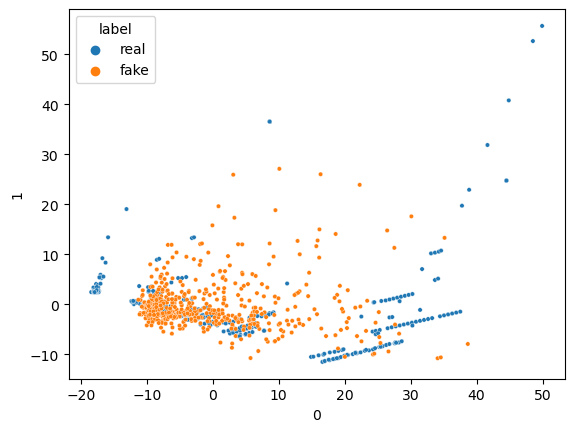

16/16 [==============================] - 0s 818us/step


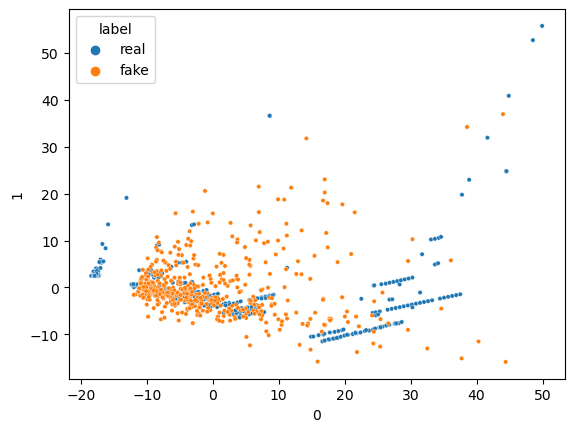

1/1 [==============================] - 0s 15ms/step


In [36]:
generator=build_generator()
discriminator=build_discriminator()
gan=build_gan(generator,discriminator)
gan.compile(optimizer='adam',loss='binary_crossentropy')


num_epochs=1000
batch_size=64
half_batch=int(batch_size/2)

for epoch in range(num_epochs):
    
    x_fake=generate_synthetic_data(generator,half_batch)
    y_fake=np.zeros((half_batch,1))
    
    x_real=data_fraud.drop('Class',axis=1).sample(half_batch)
    y_real=np.ones((half_batch,1))
    
    discriminator.trainable=True
    discriminator.train_on_batch(x_real,y_real)
    discriminator.train_on_batch(x_fake,y_fake)
    
    noise=np.random.normal(0,1,(batch_size,29))
    gan.train_on_batch(noise,np.ones((batch_size,1)))
    
    
    if epoch%10==0:
        monitor_generator(generator)


### Task 7 - Generate synthetic data using the trained Generator

*   Generate 1000 fradulent data points using the trained generator
*   Compare the distribution of `real` and `synthetic` fradulent data points.


In [47]:
synthetic_data=generate_synthetic_data(generator,1000)
df=pd.DataFrame(synthetic_data)
df['label']='fake'
df2=data_fraud.drop('Class',axis=1)
df2['label']='real'
df2.columns=df.columns
combined_df=pd.concat([df,df2])
combined_df

32/32 [==============================] - 0s 709us/step


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,label
0,-0.507877,1.555835,-1.166943,3.469820,0.641226,0.568000,-0.653025,0.339805,-1.297255,-0.385944,...,0.333253,-0.444416,0.747953,0.452056,0.038055,0.639531,0.789751,0.439355,-0.458908,fake
1,-3.126128,-1.171750,-2.739492,2.316936,-3.316275,0.236400,1.424197,1.400806,-0.322219,-5.966065,...,-0.064257,0.138286,-1.488333,-1.101355,1.325379,-0.199946,0.351285,-1.080295,3.916670,fake
2,-1.171948,2.120639,-5.245605,1.977990,-0.399737,-0.549791,-0.268045,0.132686,0.258855,-3.224914,...,0.716318,-0.841496,0.328277,-0.283274,0.468722,-0.220569,0.784310,0.481956,-0.108504,fake
3,-7.293006,4.513160,-2.918429,3.755995,0.894375,-2.199179,-7.721463,3.180219,-5.639709,-2.652885,...,-1.276843,0.427459,-4.155477,-0.005599,2.260167,1.711061,-0.727994,0.464960,-1.360375,fake
4,-3.482743,0.630082,-2.656295,2.463123,-0.919102,-0.043030,-1.336155,1.696365,0.087194,-2.635471,...,-0.367477,0.123142,-0.139505,-0.152811,0.165919,-0.228656,1.020886,-0.403069,1.376271,fake
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50487,-1.927883,1.125653,-4.518331,1.749293,-1.566487,-2.010494,-0.882850,0.697211,-2.064945,-5.587794,...,0.778584,-0.319189,0.639419,-0.294885,0.537503,0.788395,0.292680,0.147968,1.277825,real
50488,1.378559,1.289381,-5.004247,1.411850,0.442581,-1.326536,-1.413170,0.248525,-1.127396,-3.232153,...,0.370612,0.028234,-0.145640,-0.081049,0.521875,0.739467,0.389152,0.186637,-0.369281,real
50489,-0.676143,1.126366,-2.213700,0.468308,-1.120541,-0.003346,-2.234739,1.210158,-0.652250,-3.463891,...,0.751826,0.834108,0.190944,0.032070,-0.739695,0.471111,0.385107,0.194361,-0.042898,real
50490,-3.113832,0.585864,-5.399730,1.817092,-0.840618,-2.943548,-2.208002,1.058733,-1.632333,-5.245984,...,0.583276,-0.269209,-0.456108,-0.183659,-0.328168,0.606116,0.884876,-0.253700,0.664244,real


Checking the individual feature distribution of `synthetic` and `real` fraud data.

In [48]:
for col in combined_df.columns:
    plt.figure()
    fig = px.histogram(combined_df, color = 'label', x=col,barmode="overlay", title = f'Feature {col}', width = 640, height = 500)
    fig.show()

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>